<a href="https://colab.research.google.com/github/alifanaura/pengolahan-citra-digital/blob/main/Tugas-1/PCD_Assignment01.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Nama: Naura Alifa Damayanti

NIM: 25/556087/PA/23338

---



In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Penguin.jpg to Penguin.jpg


Membaca dan Menampilkan Foto

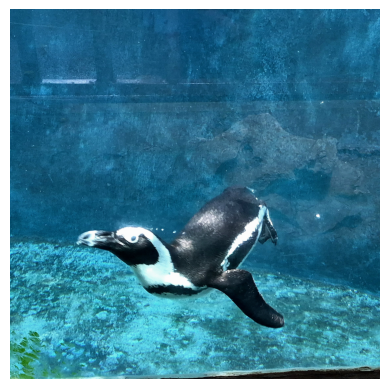

Ukuran gambar:  (2248, 2250)


In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

img = Image.open("Penguin.jpg")

plt.imshow(img)
plt.axis("off")
plt.show()

print("Ukuran gambar: ", img.size)

Down Sampling (Max)

In [ ]:
import numpy as np

img_array = np.array(img)

factor = 16

height, width, channels = img_array.shape

new_height = height - (height % factor)
new_width = width - (width % factor)

img_crop = img_array[:new_height, :new_width]

blocks = img_crop.reshape(
    new_height // factor,
    factor,
    new_width // factor,
    factor,
    channels
)

down_max = blocks.max(axis=(1, 3))

print("Ukuran gambar asli:", img_crop.shape)
print("Ukuran setelah Max Down Sampling:", down_max.shape)

Ukuran gambar asli: (2240, 2240, 3)
Ukuran setelah Max Down Sampling: (140, 140, 3)


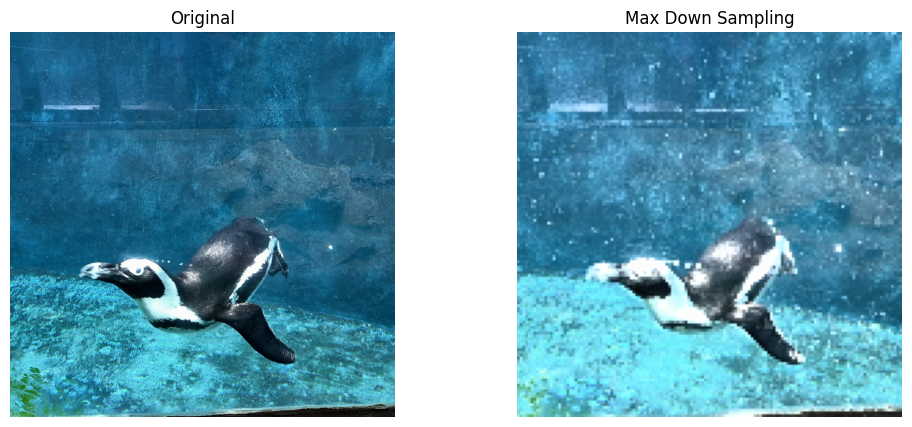

In [ ]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(down_max)
plt.title("Max Down Sampling")
plt.axis("off")

plt.show()

Average Down Sampling

In [ ]:
blocks = img_crop.reshape(
    new_height // factor,
    factor,
    new_width // factor,
    factor,
    channels
)

down_average = blocks.mean(axis=(1,3)).astype(np.uint8)

print("Ukuran gambar setelah Average Down Sampling:", down_average.shape)

Ukuran gambar setelah Average Down Sampling: (140, 140, 3)


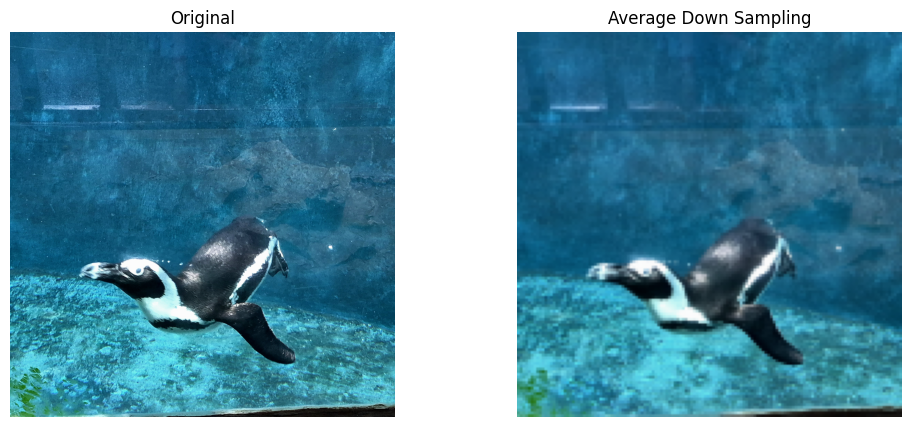

In [ ]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(down_average)
plt.title("Average Down Sampling")
plt.axis("off")

plt.show()

Median Down Sampling

In [ ]:
down_median = np.median(blocks, axis=(1,3)).astype(np.uint8)

print("Ukuran gambar setelah Median Down Sampling:", down_median.shape)

Ukuran gambar setelah Median Down Sampling: (140, 140, 3)


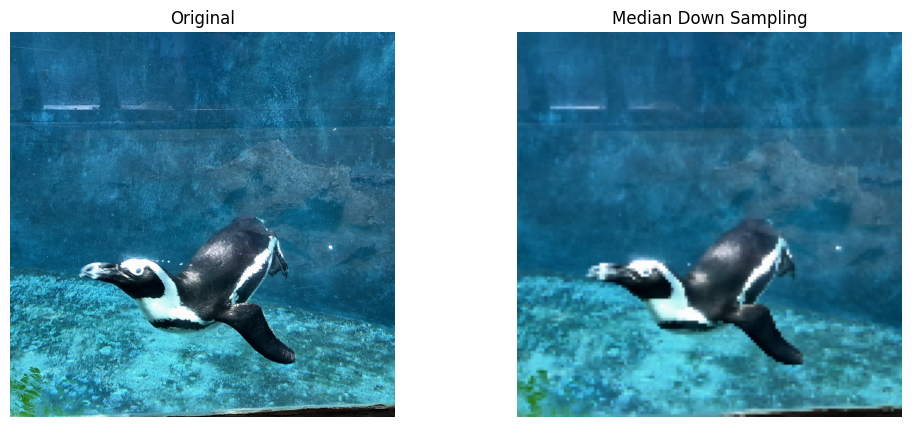

In [ ]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(down_median)
plt.title("Median Down Sampling")
plt.axis("off")

plt.show()

Nearest Neighbor (NN) Up Sampling

In [ ]:
up_nn = np.repeat(np.repeat(down_average, 16, axis=0), 16, axis=1)

print("Ukuran gambar setelah NN Up Sampling:", up_nn.shape)

Ukuran gambar setelah NN Up Sampling: (2240, 2240, 3)


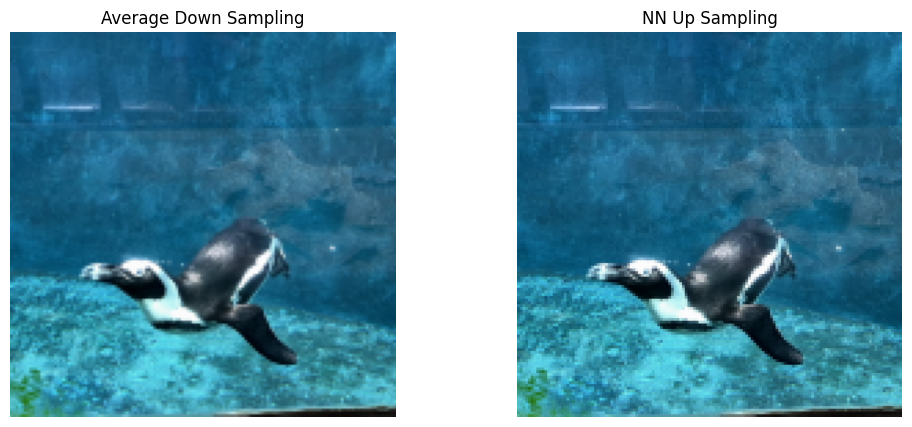

In [ ]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(down_average)
plt.title("Average Down Sampling")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(up_nn)
plt.title("NN Up Sampling")
plt.axis("off")

plt.show()

Bilinear Up Sampling

In [ ]:
up_bilinear = Image.fromarray(down_average).resize(
    (2240, 2240),
    Image.Resampling.BILINEAR
)

up_bilinear = np.array(up_bilinear)

print("Ukuran gambar setelah Bilinear Up Sampling:", up_bilinear.shape)

Ukuran gambar setelah Bilinear Up Sampling: (2240, 2240, 3)


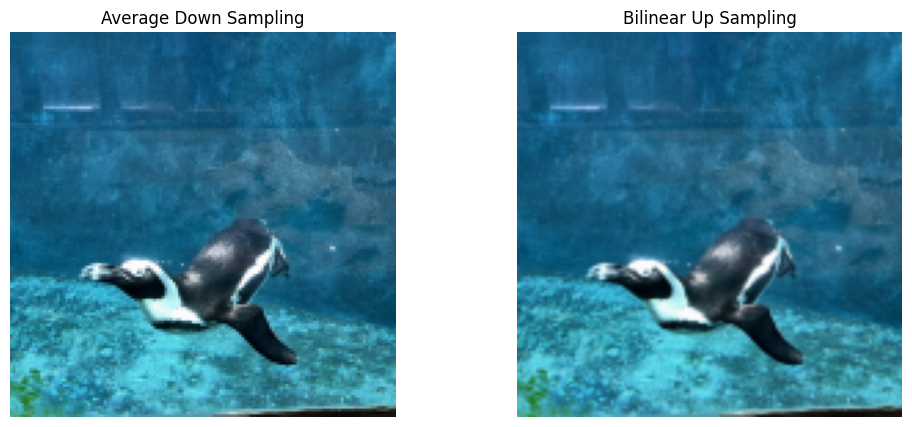

In [ ]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(down_average)
plt.title("Average Down Sampling")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(up_bilinear)
plt.title("Bilinear Up Sampling")
plt.axis("off")

plt.show()

Bicubic Up Sampling

In [ ]:
up_bicubic = Image.fromarray(down_average).resize(
    (2240, 2240),
    Image.Resampling.BICUBIC
)

up_bicubic = np.array(up_bicubic)

print("Ukuran gambar setelah Bicubic Up Sampling:", up_bicubic.shape)

Ukuran gambar setelah Bicubic Up Sampling: (2240, 2240, 3)


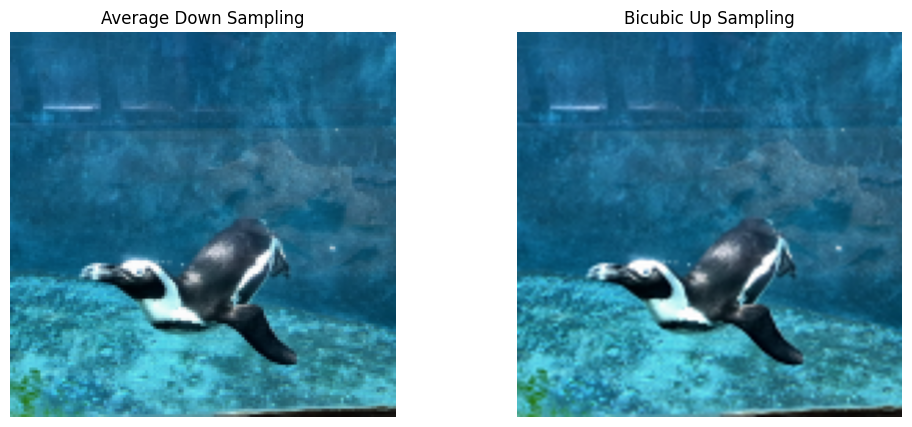

In [ ]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(down_average)
plt.title("Average Down Sampling")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(up_bicubic)
plt.title("Bicubic Up Sampling")
plt.axis("off")

plt.show()

Hasil Down Sampling dan Up Sampling

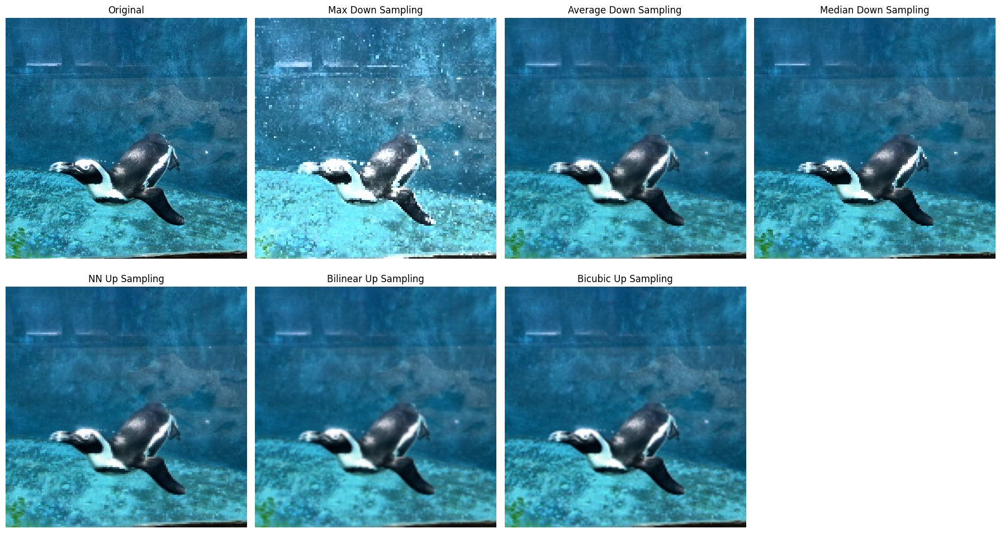

In [ ]:
plt.figure(figsize=(18, 10))

plt.subplot(2, 4, 1)
plt.imshow(img)
plt.title("Original")
plt.axis("off")

plt.subplot(2, 4, 2)
plt.imshow(down_max)
plt.title("Max Down Sampling")
plt.axis("off")

plt.subplot(2, 4, 3)
plt.imshow(down_average)
plt.title("Average Down Sampling")
plt.axis("off")

plt.subplot(2, 4, 4)
plt.imshow(down_median)
plt.title("Median Down Sampling")
plt.axis("off")

plt.subplot(2, 4, 5)
plt.imshow(up_nn)
plt.title("NN Up Sampling")
plt.axis("off")

plt.subplot(2, 4, 6)
plt.imshow(up_bilinear)
plt.title("Bilinear Up Sampling")
plt.axis("off")

plt.subplot(2, 4, 7)
plt.imshow(up_bicubic)
plt.title("Bicubic Up Sampling")
plt.axis("off")

plt.tight_layout()
plt.show()

Download Gambar

In [ ]:
from PIL import Image
import zipfile
from google.colab import files

hasil = {
    "Max_Down_Sampling.jpg": down_max,
    "Average_Down_Sampling.jpg": down_average,
    "Median_Down_Sampling.jpg": down_median,
    "NN_Up_Sampling.jpg": up_nn,
    "Bilinear_Up_Sampling.jpg": up_bilinear,
    "Bicubic_Up_Sampling.jpg": up_bicubic
}

for nama, gambar in hasil.items():
    plt.figure(figsize=(8, 8))
    plt.imshow(gambar)
    plt.title(nama.replace(".jpg", "").replace("_", " "), fontsize=18)
    plt.axis("off")
    plt.savefig(nama, bbox_inches="tight")
    plt.close()

with zipfile.ZipFile("PCD_Assignment01_Results.zip", "w") as zip_file:
    for nama in hasil:
        zip_file.write(nama)

files.download("PCD_Assignment01_Results.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Grafik RGB

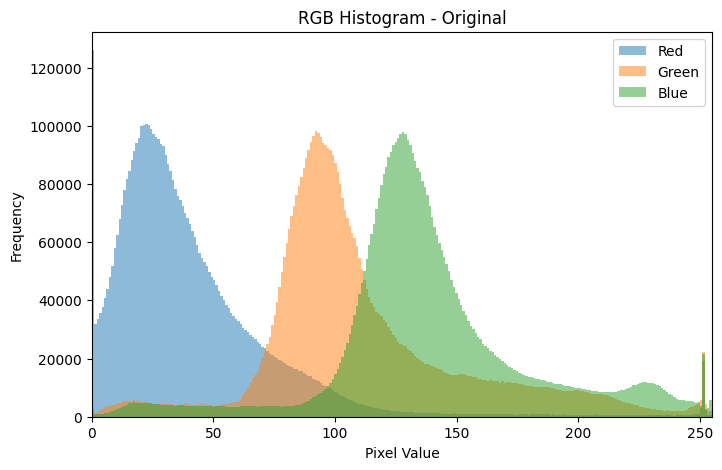

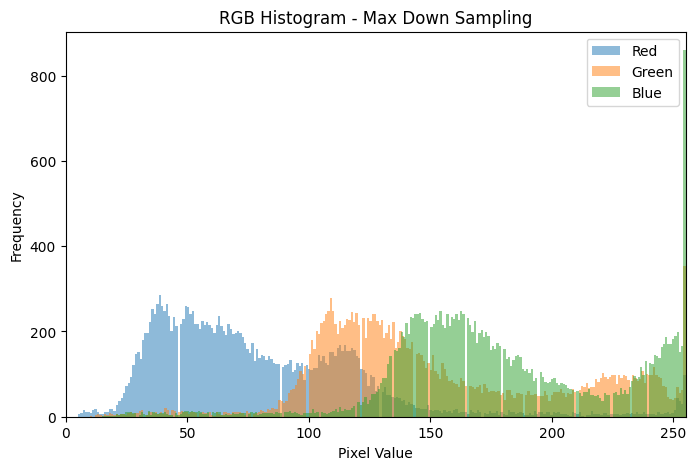

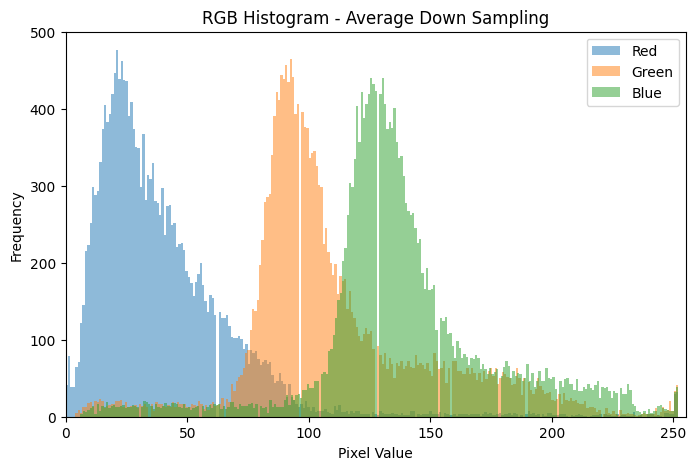

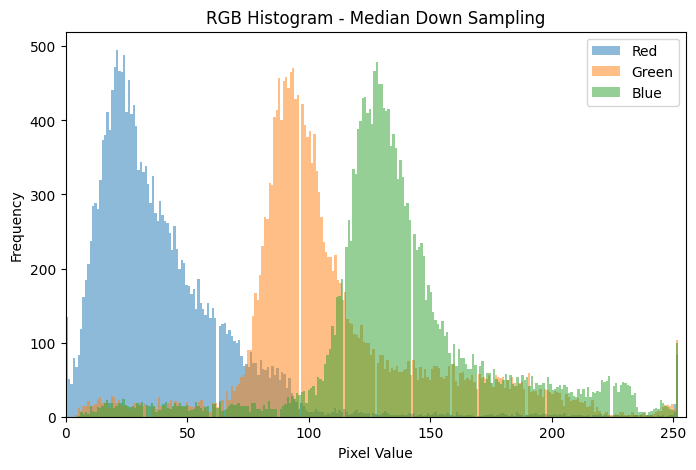

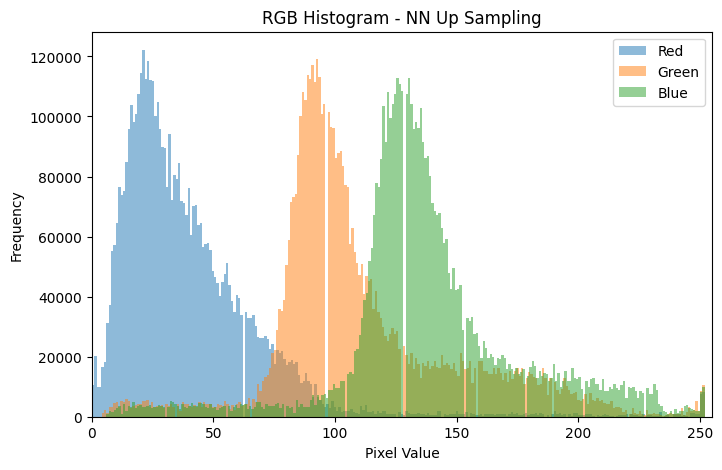

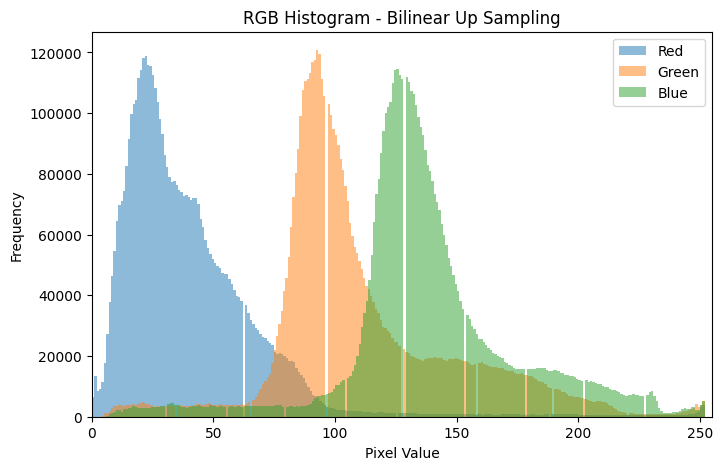

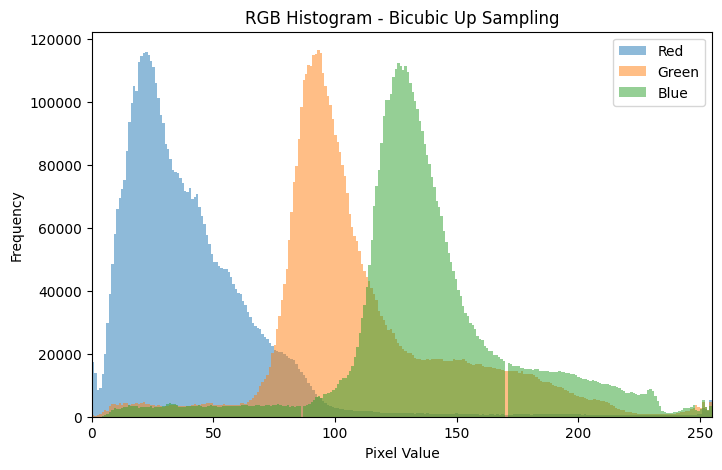

In [ ]:
import matplotlib.pyplot as plt

gambar = {
    "Original": np.array(img),
    "Max Down Sampling": down_max,
    "Average Down Sampling": down_average,
    "Median Down Sampling": down_median,
    "NN Up Sampling": up_nn,
    "Bilinear Up Sampling": up_bilinear,
    "Bicubic Up Sampling": up_bicubic
}

for nama, image in gambar.items():
    plt.figure(figsize=(8, 5))

    plt.hist(image[:, :, 0].ravel(), bins=256, alpha=0.5, label="Red")
    plt.hist(image[:, :, 1].ravel(), bins=256, alpha=0.5, label="Green")
    plt.hist(image[:, :, 2].ravel(), bins=256, alpha=0.5, label="Blue")

    plt.title("RGB Histogram - " + nama)
    plt.xlabel("Pixel Value")
    plt.ylabel("Frequency")
    plt.xlim(0, 255)
    plt.legend()
    plt.show()

Upload Gambar Kedua

In [ ]:
from google.colab import files

uploaded = files.upload()

Saving Cat.jpg to Cat.jpg


Menampilkan gambar

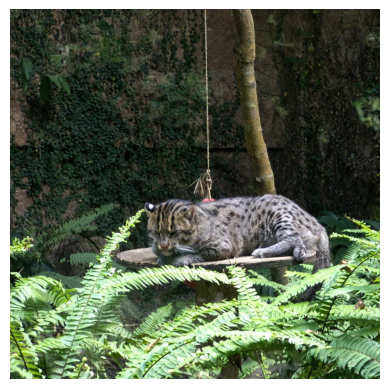

Ukuran gambar: (2250, 2252)


In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

img2 = Image.open("Cat.jpg")

plt.imshow(img2)
plt.axis("off")
plt.show()

print("Ukuran gambar:", img2.size)

Max Down Sampling

In [ ]:
import numpy as np
img2_array = np.array(img2)

factor = 16

height, width, channels = img2_array.shape

new_height = height - (height % factor)
new_width = width - (width % factor)

img2_crop = img2_array[:new_height, :new_width]

blocks2 = img2_crop.reshape(
    new_height // factor,
    factor,
    new_width // factor,
    factor,
    channels
)

down_max2 = blocks2.max(axis=(1, 3))

print("Ukuran gambar asli:", img2_crop.shape)
print("Ukuran setelah Max Down Sampling:", down_max2.shape)

Ukuran gambar asli: (2240, 2240, 3)
Ukuran setelah Max Down Sampling: (140, 140, 3)


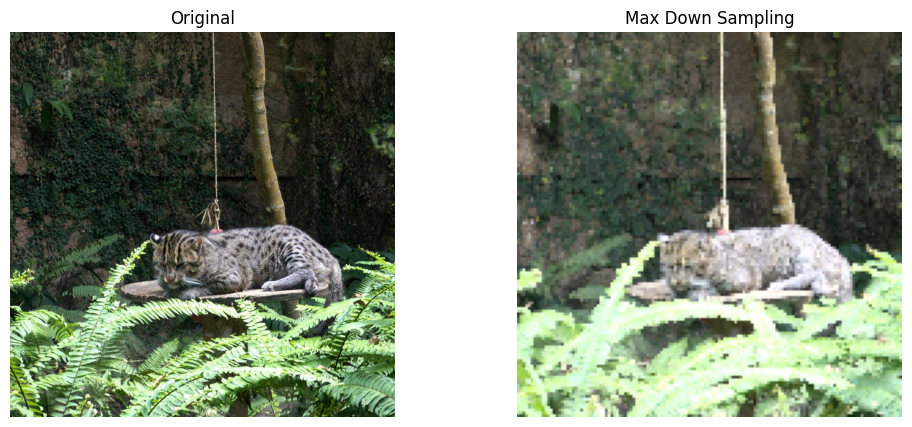

In [ ]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(img2)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(down_max2)
plt.title("Max Down Sampling")
plt.axis("off")

plt.show()

Average Down Sampling

In [ ]:
down_average2 = blocks2.mean(axis=(1, 3)).astype(np.uint8)

print("Ukuran gambar setelah Average Down Sampling:", down_average2.shape)

Ukuran gambar setelah Average Down Sampling: (140, 140, 3)


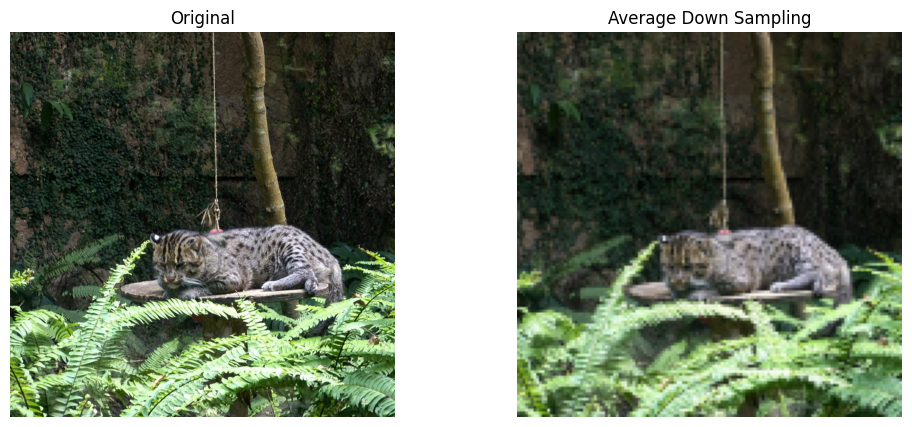

In [ ]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(img2)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(down_average2)
plt.title("Average Down Sampling")
plt.axis("off")

plt.show()

Median Down Sampling

In [ ]:
down_median2 = np.median(blocks2, axis=(1, 3)).astype(np.uint8)

print("Ukuran gambar setelah Median Down Sampling:", down_median2.shape)

Ukuran gambar setelah Median Down Sampling: (140, 140, 3)


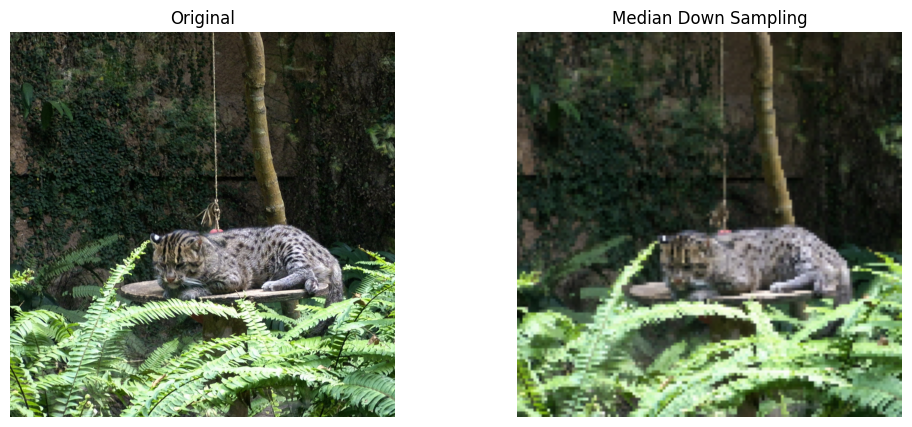

In [ ]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(img2)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(down_median2)
plt.title("Median Down Sampling")
plt.axis("off")

plt.show()

Nearest Neighbor Up Sampling

In [ ]:
up_nn2 = np.repeat(np.repeat(down_average2, 16, axis=0), 16, axis=1)

print("Ukuran gambar setelah NN Up Sampling:", up_nn2.shape)

Ukuran gambar setelah NN Up Sampling: (2240, 2240, 3)


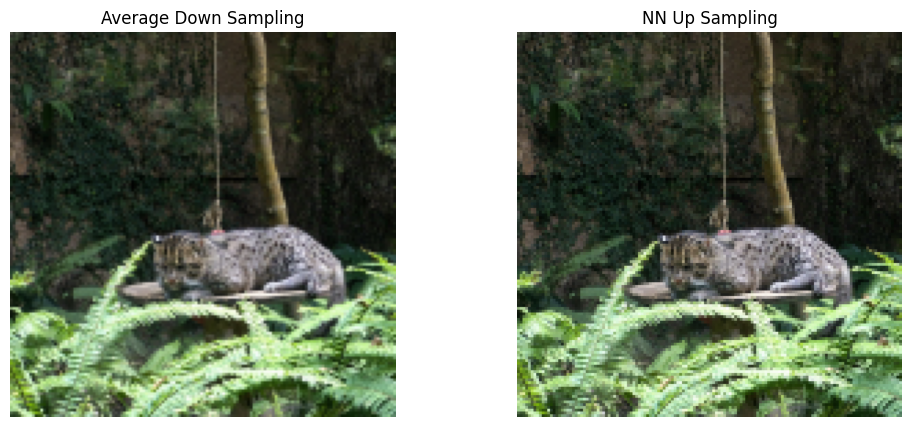

In [ ]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(down_average2)
plt.title("Average Down Sampling")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(up_nn2)
plt.title("NN Up Sampling")
plt.axis("off")

plt.show()

Bilinear Up Sampling

In [ ]:
up_bilinear2 = Image.fromarray(down_average2).resize(
    (2240, 2240),
    Image.Resampling.BILINEAR
)

up_bilinear2 = np.array(up_bilinear2)

print("Ukuran gambar setelah Bilinear Up Sampling:", up_bilinear2.shape)

Ukuran gambar setelah Bilinear Up Sampling: (2240, 2240, 3)


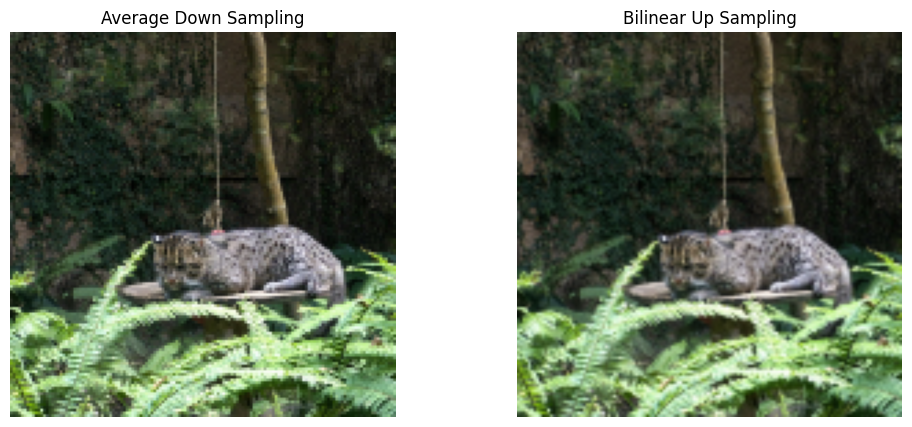

In [ ]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(down_average2)
plt.title("Average Down Sampling")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(up_bilinear2)
plt.title("Bilinear Up Sampling")
plt.axis("off")

plt.show()

Bicubic Up Sampling

In [ ]:
up_bicubic2 = Image.fromarray(down_average2).resize(
    (2240, 2240),
    Image.Resampling.BICUBIC
)

up_bicubic2 = np.array(up_bicubic2)

print("Ukuran gambar setelah Bicubic Up Sampling:", up_bicubic2.shape)

Ukuran gambar setelah Bicubic Up Sampling: (2240, 2240, 3)


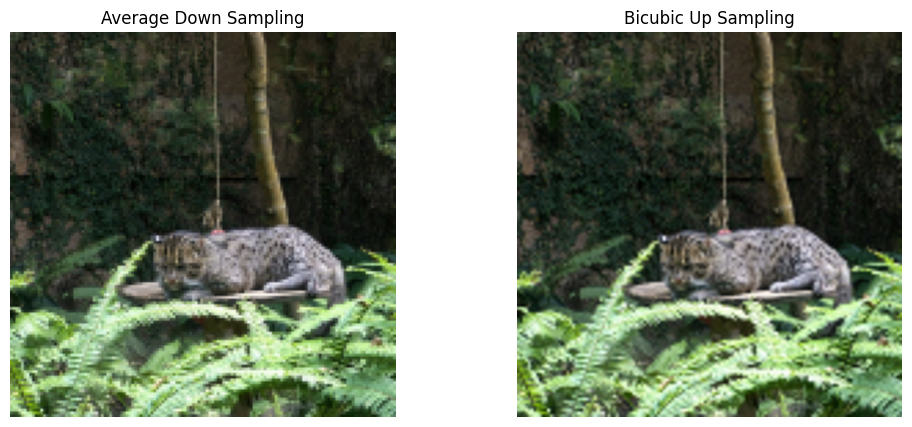

In [ ]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(down_average2)
plt.title("Average Down Sampling")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(up_bicubic2)
plt.title("Bicubic Up Sampling")
plt.axis("off")

plt.show()

Hasil Down Sampling dan Up Sampling

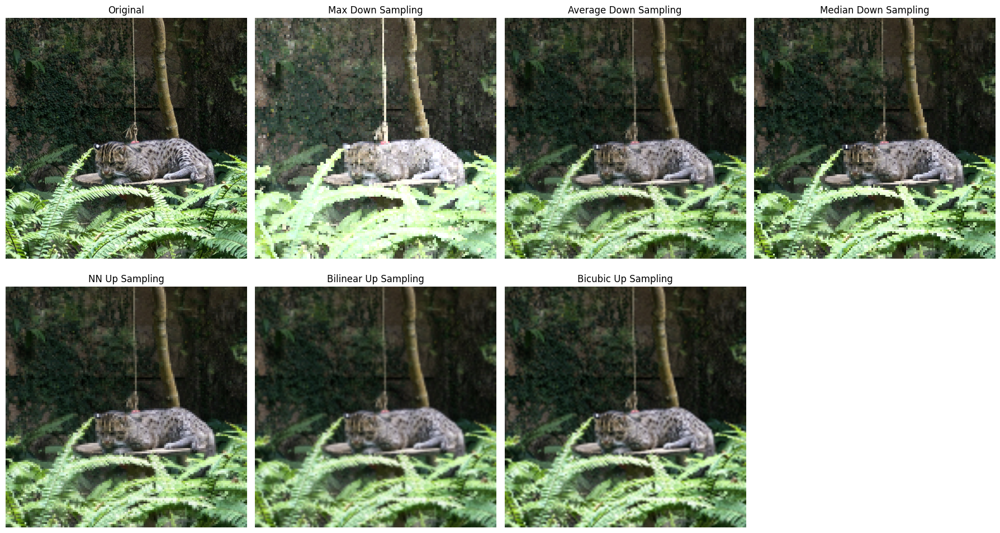

In [ ]:
plt.figure(figsize=(18, 10))

plt.subplot(2, 4, 1)
plt.imshow(img2)
plt.title("Original")
plt.axis("off")

plt.subplot(2, 4, 2)
plt.imshow(down_max2)
plt.title("Max Down Sampling")
plt.axis("off")

plt.subplot(2, 4, 3)
plt.imshow(down_average2)
plt.title("Average Down Sampling")
plt.axis("off")

plt.subplot(2, 4, 4)
plt.imshow(down_median2)
plt.title("Median Down Sampling")
plt.axis("off")

plt.subplot(2, 4, 5)
plt.imshow(up_nn2)
plt.title("NN Up Sampling")
plt.axis("off")

plt.subplot(2, 4, 6)
plt.imshow(up_bilinear2)
plt.title("Bilinear Up Sampling")
plt.axis("off")

plt.subplot(2, 4, 7)
plt.imshow(up_bicubic2)
plt.title("Bicubic Up Sampling")
plt.axis("off")

plt.tight_layout()
plt.show()

Download Gambar

In [ ]:
import matplotlib.pyplot as plt
import zipfile
from google.colab import files

hasil_cat = {
    "Cat_Max_Down_Sampling.jpg": (down_max2, "Max Down Sampling"),
    "Cat_Average_Down_Sampling.jpg": (down_average2, "Average Down Sampling"),
    "Cat_Median_Down_Sampling.jpg": (down_median2, "Median Down Sampling"),
    "Cat_NN_Up_Sampling.jpg": (up_nn2, "NN Up Sampling"),
    "Cat_Bilinear_Up_Sampling.jpg": (up_bilinear2, "Bilinear Up Sampling"),
    "Cat_Bicubic_Up_Sampling.jpg": (up_bicubic2, "Bicubic Up Sampling")
}

for nama, (gambar, judul) in hasil_cat.items():
    plt.figure(figsize=(8, 8))
    plt.imshow(gambar)
    plt.title(judul, fontsize=18)
    plt.axis("off")
    plt.savefig(nama, bbox_inches="tight")
    plt.close()

with zipfile.ZipFile("Cat_Results.zip", "w") as zip_file:
    for nama in hasil_cat:
        zip_file.write(nama)

files.download("Cat_Results.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Grafik RGB

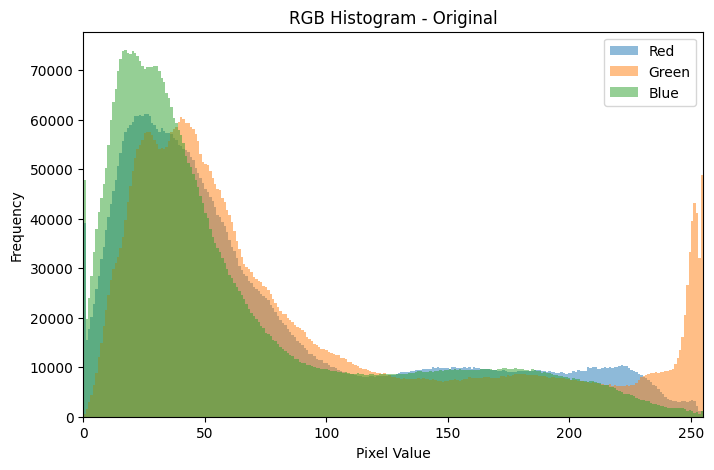

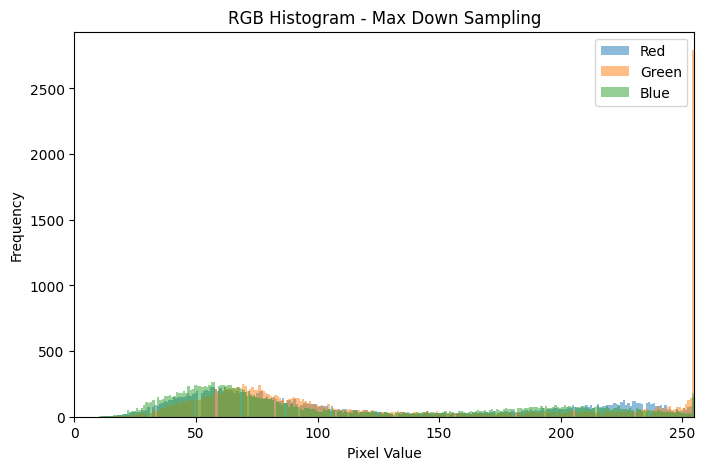

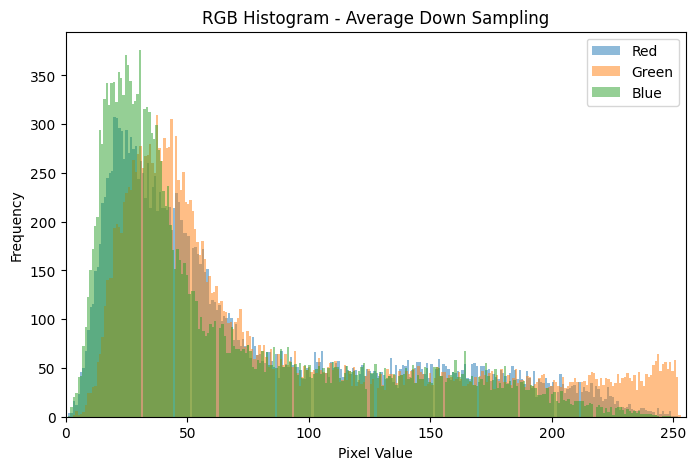

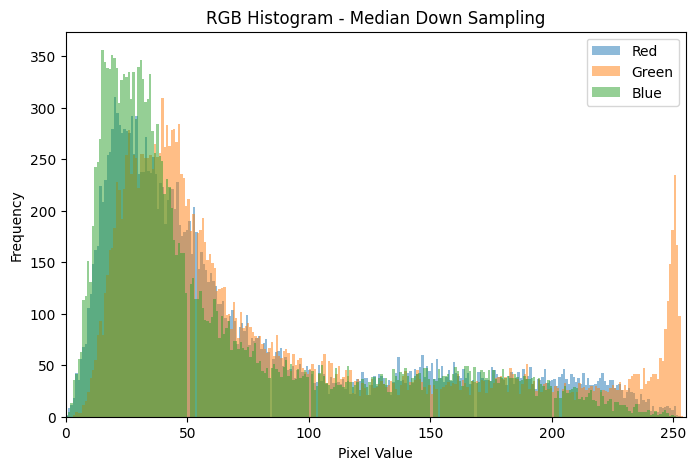

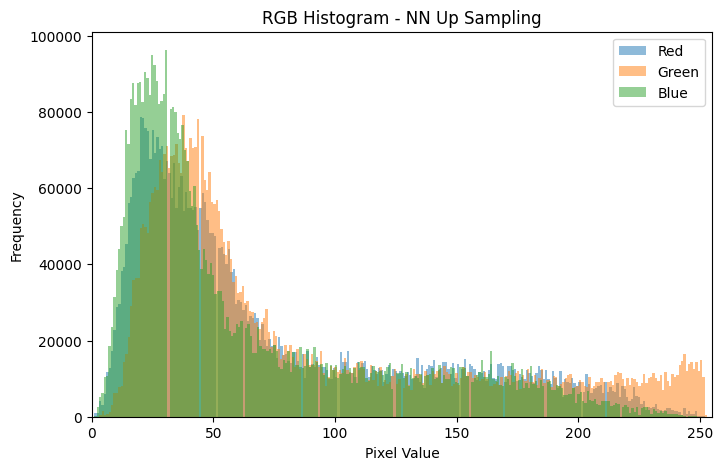

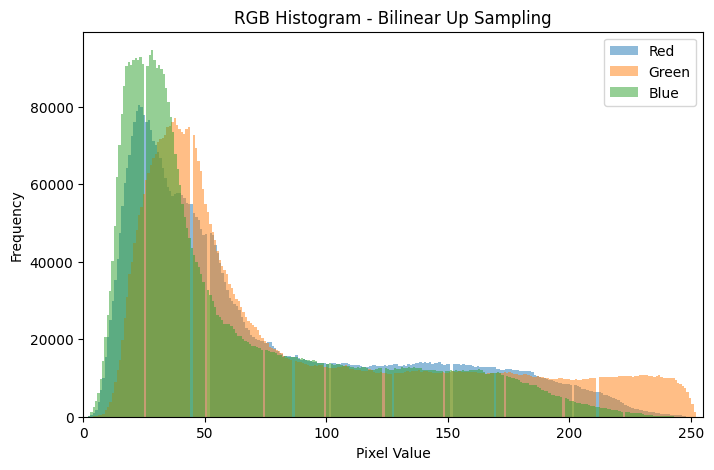

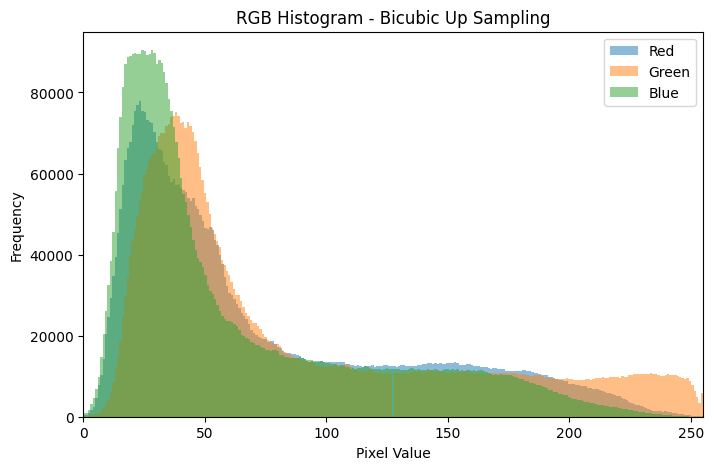

In [ ]:
import matplotlib.pyplot as plt

gambar2 = {
    "Original": np.array(img2),
    "Max Down Sampling": down_max2,
    "Average Down Sampling": down_average2,
    "Median Down Sampling": down_median2,
    "NN Up Sampling": up_nn2,
    "Bilinear Up Sampling": up_bilinear2,
    "Bicubic Up Sampling": up_bicubic2
}

for nama, image in gambar2.items():
    plt.figure(figsize=(8, 5))

    plt.hist(image[:, :, 0].ravel(), bins=256, alpha=0.5, label="Red")
    plt.hist(image[:, :, 1].ravel(), bins=256, alpha=0.5, label="Green")
    plt.hist(image[:, :, 2].ravel(), bins=256, alpha=0.5, label="Blue")

    plt.title("RGB Histogram - " + nama)
    plt.xlabel("Pixel Value")
    plt.ylabel("Frequency")
    plt.xlim(0, 255)
    plt.legend()
    plt.show()